In [166]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random

In [167]:
data_list=[]
file_names=['2006-05-13.csv','2006-05-14.csv','2006-05-15.csv','2006-05-16.csv','2006-05-17.csv', '2006-05-18.csv','2006-05-19.csv','2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']

for f in file_names:
    data=pd.read_csv('data/raw_data/'+f)
    data = data.drop(['SJX08','SJX13'],axis=1)
    if f in ['2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']:
        q25,q75=np.quantile(data['SJS13'],[0.25,0.75])
        print(q25-1.5*(q75-q25),q75+1.5*(q75-q25))
        data['SJS13'][data['SJS13']<q25-1.5*(q75-q25)]=np.nan#3000
        data['SJS13'][data['SJS13']>q75+1.5*(q75-q25)]=np.nan#2700
    data=data.interpolate(method='linear')
    data=data.iloc[90:-90]
    print(data.shape)
    data_list.append(data)

(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
2774.862492801036 2860.8972732559014
(172620, 12)
2785.931150398128 2869.0900732652844
(172620, 12)
2732.015028449452 2869.1944270294844
(172620, 12)


In [168]:
file_names=['2006-05-13','2006-05-14','2006-05-15','2006-05-16','2006-05-17', '2006-05-18','2006-05-19','2007-12-14','2009-05-05','2011-11-01']
cable_title = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]
#cable_title = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX08", "SJX09", "SJX10", "SJX11", "SJX12", "SJX13", "SJX14"]

In [169]:
datas = data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    datas[i] = data
cable_data = datas
cable_data = np.array(cable_data)

In [170]:
cable_data.shape

(10, 12, 172620)

In [171]:
from scipy.signal import find_peaks
from scipy.ndimage import median_filter

In [172]:
def make_nan_array(length, index_list, values):
    data = np.empty(length)
    data[:] = np.nan
    np.put(data, index_list, values)
    idx = np.argwhere(~np.isnan(data))[0][0]
    data[0] = data[idx]
    return data

In [173]:
def preprocess(data):
    peaks, _ = find_peaks(data, height=(np.mean(data) - np.std(data), np.mean(data) + np.std(data)))
    peak_data = make_nan_array(len(data), peaks, data[peaks])
    peak = data[peaks]
    median_peak = median_filter(peak, 50)
    median_peak_data = make_nan_array(len(data), peaks, median_peak)
    
    inter = pd.Series(median_peak_data).interpolate()
    rolling = pd.Series(inter).rolling(1200, min_periods=1).mean()
    
    return rolling, data - rolling

In [174]:
cable_rolling = []
cable_diff_rolling = []
for i in range(cable_data.shape[0]):
    rolling_datas = []
    diff_rolling_datas = []
    for j in range(cable_data.shape[1]):
        rollings = []
        data_rollings = []
        for k in range(cable_data.shape[2] // 7200):
            data = cable_data[i][j][k*7200:(k+1)*7200]
            rolling, data_rolling = preprocess(data)
            rollings.append(rolling)
            data_rollings.append(data_rolling)
        rolling = np.concatenate(rollings)
        data_rolling = np.concatenate(data_rollings)
        rolling_datas.append(rolling)
        diff_rolling_datas.append(data_rolling)
    rolling_datas = np.array(rolling_datas)
    diff_rolling_datas = np.array(diff_rolling_datas)
    cable_rolling.append(rolling_datas)
    cable_diff_rolling.append(diff_rolling_datas)
    print(rolling_datas.shape, diff_rolling_datas.shape)
cable_rolling = np.array(cable_rolling)
cable_diff_rolling = np.array(cable_diff_rolling)
cable_rolling.shape, cable_diff_rolling.shape

(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)
(12, 165600) (12, 165600)


((10, 12, 165600), (10, 12, 165600))

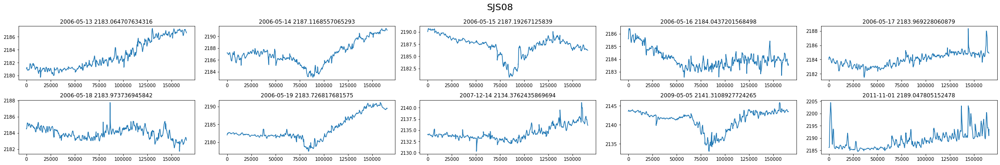

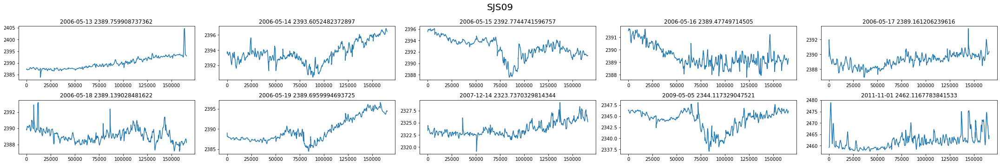

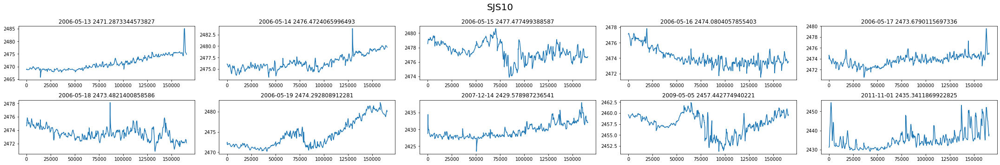

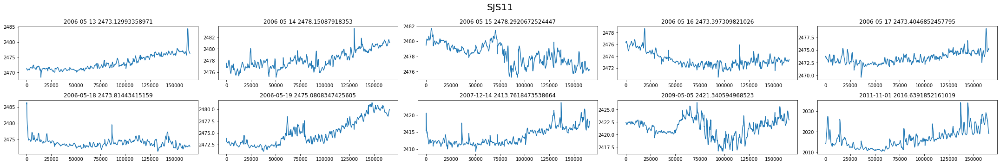

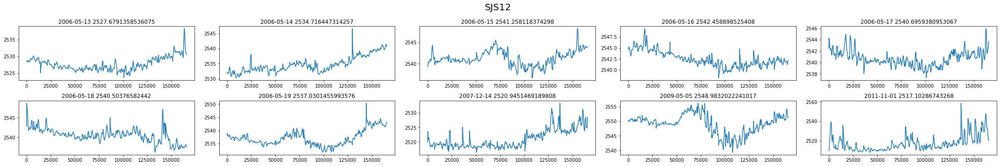

...

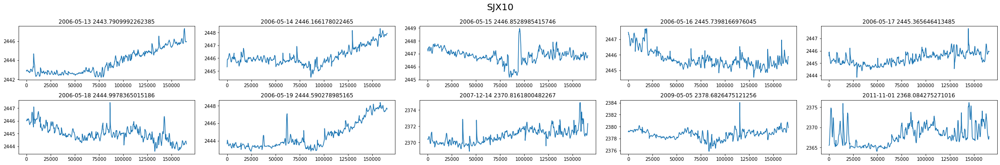

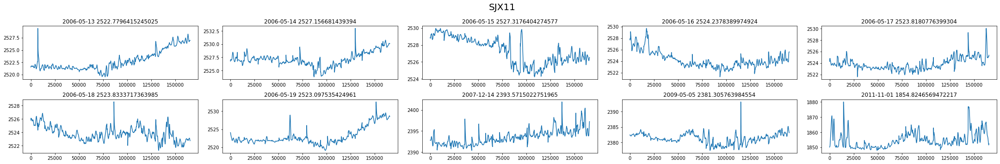

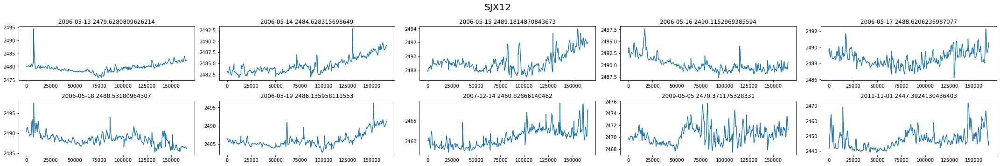

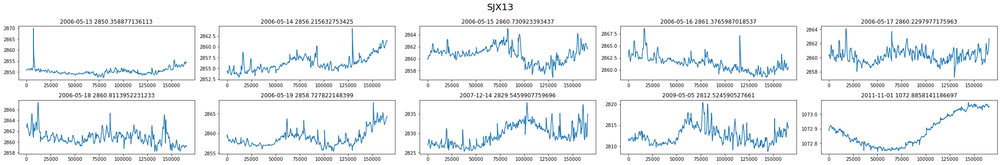

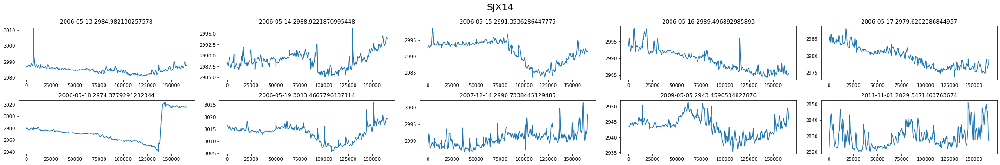

In [62]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_rolling[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_rolling[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

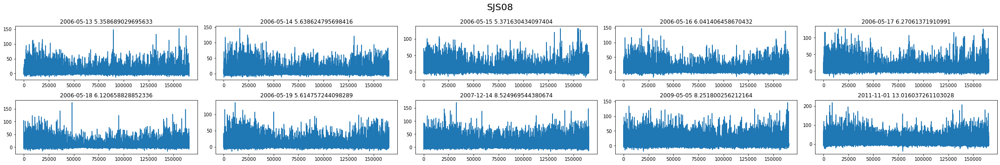

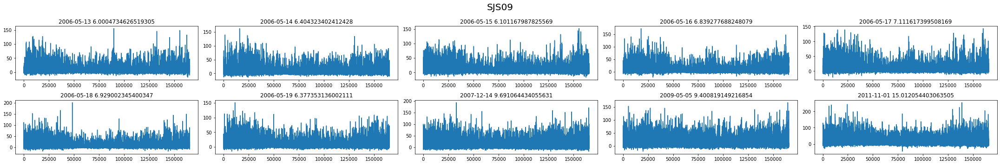

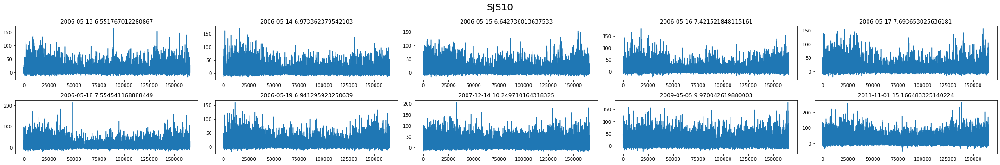

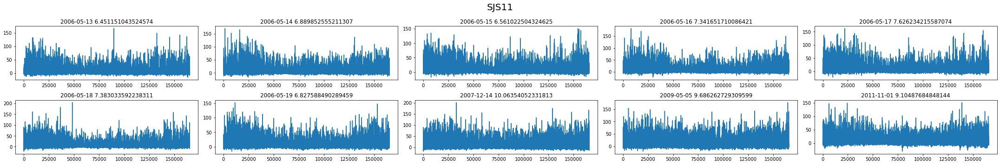

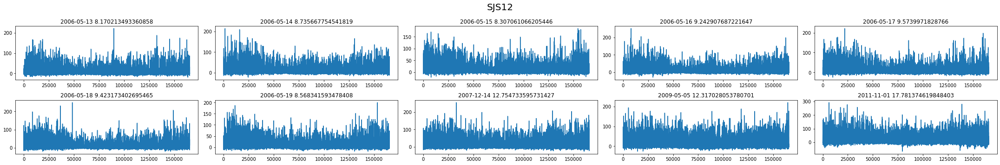

...

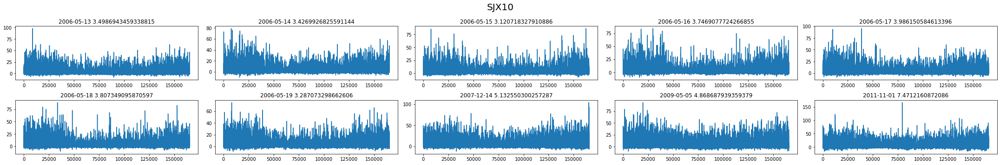

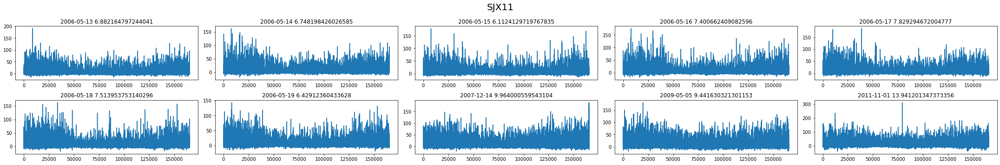

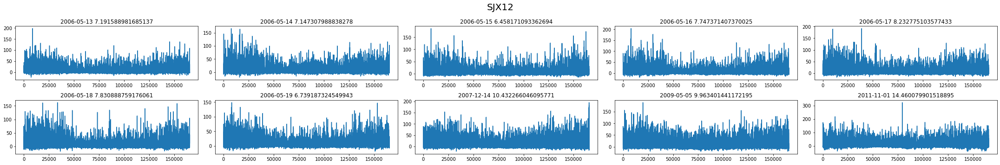

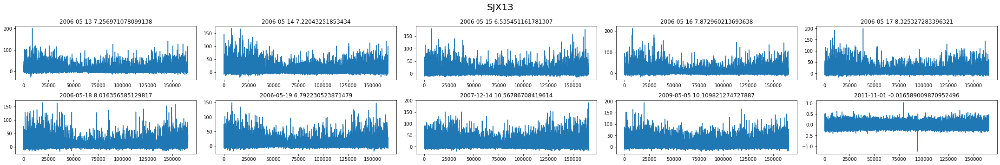

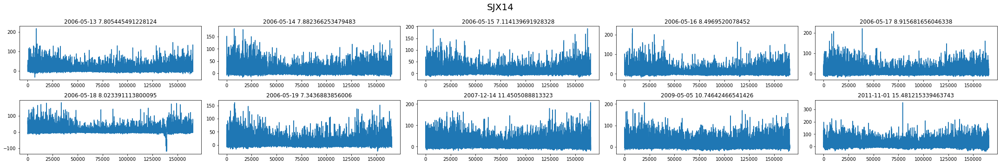

In [63]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_diff_rolling[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_diff_rolling[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

In [65]:
from scipy.signal import detrend

In [68]:
detrends_data = []
for i in range(10):
    detrends = []
    for j in range(14):
        d = detrend(cable_data[i][j])
        detrends.append(d)
    detrends_data.append(np.array(detrends))
detrends_data = np.array(detrends_data)
detrends_data.shape

(10, 14, 172620)

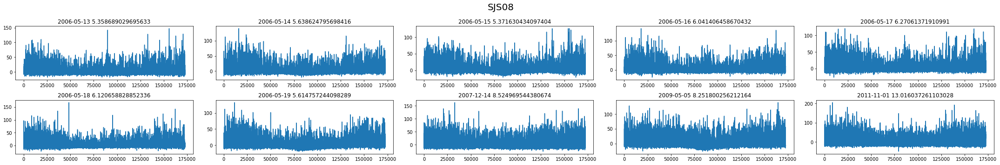

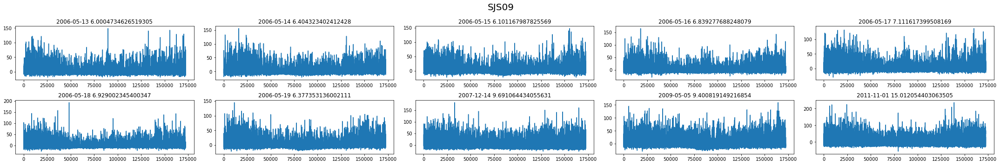

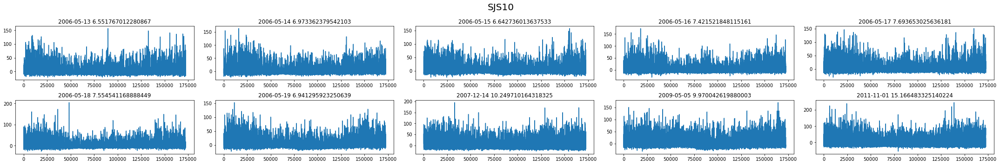

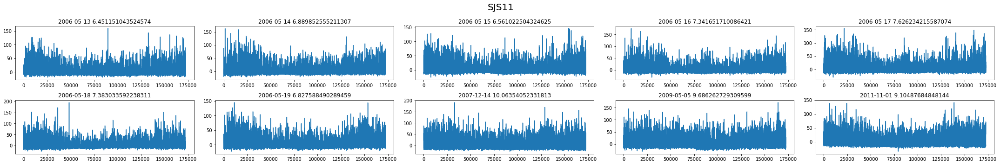

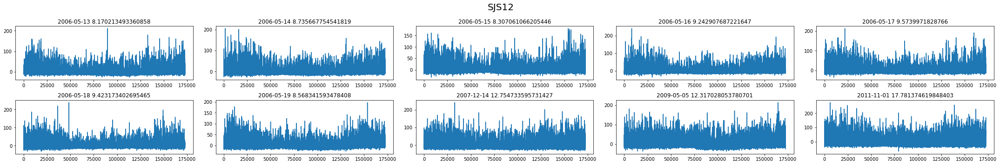

...

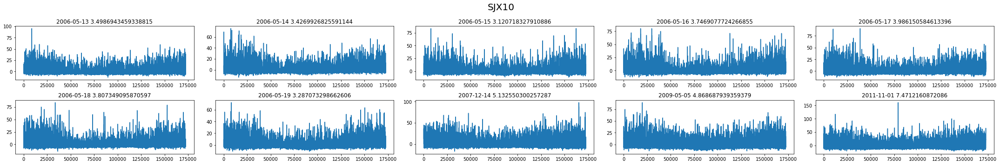

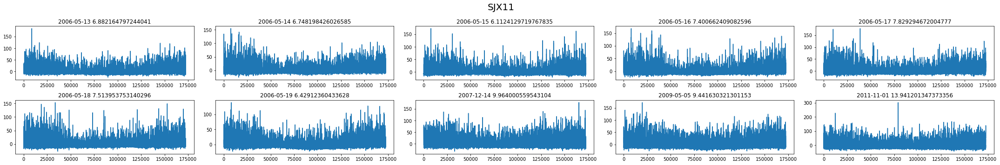

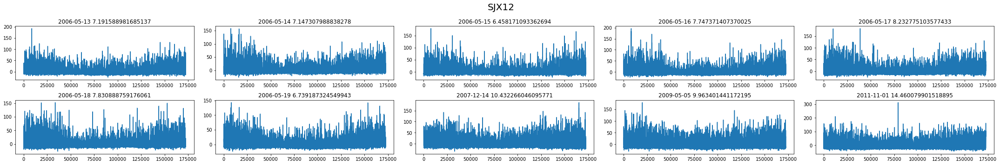

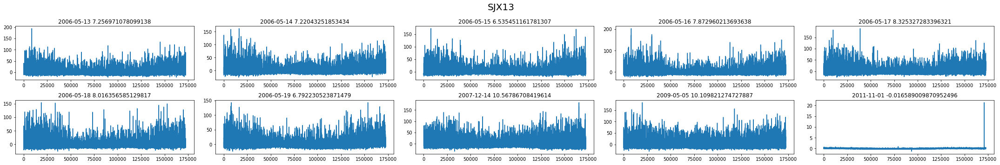

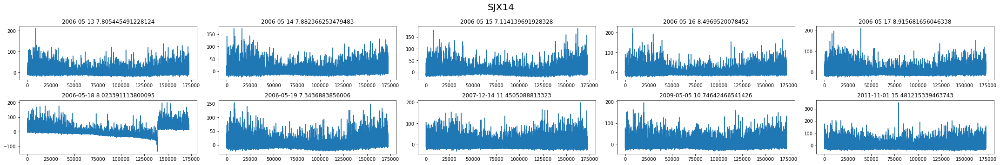

In [69]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_diff_rolling[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(detrends_data[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

In [64]:
for i in range(10):
    data = cable_diff_rolling[i]
    data = np.transpose(data)
    df = pd.DataFrame(data, columns = cable_title)
    path = 'data/rolling/' + file_names[i] + '.csv'
    print(path)
    df.to_csv(path)

data/rolling/2006-05-13.csv
data/rolling/2006-05-14.csv
data/rolling/2006-05-15.csv
data/rolling/2006-05-16.csv
data/rolling/2006-05-17.csv
data/rolling/2006-05-18.csv
data/rolling/2006-05-19.csv
data/rolling/2007-12-14.csv
data/rolling/2009-05-05.csv
data/rolling/2011-11-01.csv


### Clustering

In [80]:
cable_diff_rolling.shape

(10, 12, 165600)

In [81]:
cable_train = cable_diff_rolling.reshape(-1, 165600)
cable_train.shape

(120, 165600)

In [116]:
cable_train_2011 = cable_diff_rolling[-1]
cable_train_2011.shape

(12, 165600)

In [83]:
from tslearn.clustering import TimeSeriesKMeans

In [84]:
km = TimeSeriesKMeans(n_clusters = 10, verbose=True, random_state=0)
y_pred = km.fit_predict(cable_train)
y_pred = y_pred.reshape(10,12)
y_pred

22859928.201 --> 14489927.153 --> 13769944.746 --> 13710813.774 --> 13710813.774 --> 


array([[8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
       [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5],
       [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
       [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
       [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
       [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
       [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=int64)

In [85]:
km = TimeSeriesKMeans(n_clusters = 4, verbose=True, random_state=0)
y_pred = km.fit_predict(cable_train_2011)
y_pred

18610740.484 --> 13637375.888 --> 13637375.888 --> 


array([2, 2, 2, 2, 3, 0, 3, 2, 1, 1, 1, 1], dtype=int64)

In [111]:
from collections import defaultdict

In [112]:
def decode_array(pred):
    cable_title = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]
    dic = dict(zip(cable_title, y_pred))
    
    res = defaultdict(list)
    for key, val in sorted(dic.items()):
        res[val].append(key)
    return res

In [113]:
res = decode_array(y_pred)
res

defaultdict(list,
            {2: ['SJS08', 'SJS09', 'SJS10', 'SJS11', 'SJX09'],
             3: ['SJS12', 'SJS14'],
             0: ['SJS13'],
             1: ['SJX10', 'SJX11', 'SJX12', 'SJX14']})

In [117]:
cable_train_2011_dtw = cable_train_2011[:,::180]
cable_train_2011_dtw.shape

(12, 920)

In [118]:
km = TimeSeriesKMeans(n_clusters=2, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(cable_train_2011_dtw)
y_pred

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


168920.259 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


112981.391 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


112981.391 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


183633.163 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


110573.126 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


105592.738 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


105592.738 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


array([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], dtype=int64)

In [119]:
res = decode_array(y_pred)
res

defaultdict(list,
            {0: ['SJS08',
              'SJS09',
              'SJS10',
              'SJS11',
              'SJX09',
              'SJX10',
              'SJX11',
              'SJX12'],
             1: ['SJS12', 'SJS13', 'SJS14', 'SJX14']})

In [120]:
km = TimeSeriesKMeans(n_clusters=4, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(cable_train_2011_dtw)
y_pred

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.2s finished


97583.577 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


67173.965 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


67173.965 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


93236.952 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


65997.745 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


65997.745 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


array([2, 2, 2, 2, 1, 1, 1, 0, 2, 3, 3, 3], dtype=int64)

In [121]:
res = decode_array(y_pred)
res

defaultdict(list,
            {2: ['SJS08', 'SJS09', 'SJS10', 'SJS11', 'SJX10'],
             1: ['SJS12', 'SJS13', 'SJS14'],
             0: ['SJX09'],
             3: ['SJX11', 'SJX12', 'SJX14']})

In [123]:
cable_train_dtw = cable_train[:,::180]
cable_train_dtw.shape

(120, 920)

In [125]:
km = TimeSeriesKMeans(n_clusters=4, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(cable_train_dtw)
y_pred = y_pred.reshape(10,12)
y_pred

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.2s finished


89285.841 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.2s finished


70283.727 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.5s finished


69213.897 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.5s finished


68653.889 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.4s finished


68653.889 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.4s finished


81947.784 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.5s finished


65075.402 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.5s finished


64736.626 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.5s finished


64471.736 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.4s finished


64471.736 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.4s finished


array([[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
       [2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2],
       [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
       [2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2],
       [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
       [2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0],
       [2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2],
       [2, 2, 3, 3, 3, 2, 3, 3, 2, 3, 3, 3],
       [2, 3, 3, 3, 3, 2, 3, 3, 2, 3, 3, 3],
       [1, 1, 1, 0, 1, 3, 1, 1, 2, 1, 1, 1]], dtype=int64)

In [ ]:
["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]

In [129]:
for cluster in range(2, 20):
    km = TimeSeriesKMeans(n_clusters=cluster, n_init=2, metric="dtw", verbose=False, max_iter_barycenter=10, random_state=0)
    y_pred = km.fit_predict(cable_train_dtw)
    y_pred = y_pred.reshape(10,12)
    print('Cluster: ' + str(cluster))
    print(y_pred)
    print('')

Cluster: 2
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 1 0 1 1 0 1 1 1]
 [0 0 0 0 1 0 0 0 0 0 0 1]
 [1 1 1 0 1 1 1 1 0 1 1 1]]

Cluster: 3
[[1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 0 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1 1]
 [1 0 0 0 0 1 0 0 1 0 0 0]
 [1 1 1 1 0 1 0 1 1 1 1 1]
 [2 2 2 1 2 0 0 2 1 2 2 2]]

Cluster: 4
[[2 2 2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 0 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 3 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [2 2 2 0 0 0 0 2 2 2 0 0]
 [2 2 2 2 0 2 2 2 2 2 2 2]
 [2 2 3 3 3 2 3 3 2 3 3 3]
 [2 3 3 3 3 2 3 3 2 3 3 3]
 [1 1 1 0 1 3 1 1 2 1 1 1]]

Cluster: 5
[[0 3 3 3 3 3 3 3 0 3 3 3]
 [0 3 3 3 3 3 3 3 0 3 3 3]
 [0 0 0 3 3 3 3 0 0 0 3 3]
 [0 0 3 3 3 3 3 3 0 3 3 3]
 [0 3 3 2 2 2 2 3 0 2 2 2]
 [0 3

In [137]:
for cluster in range(2, 20):
    km = TimeSeriesKMeans(n_clusters=cluster, n_init=2, metric="softdtw", verbose=False, max_iter_barycenter=10, random_state=0)
    y_pred = km.fit_predict(cable_train_2011_dtw)
    #y_pred = y_pred.reshape(10,12)
    print('Cluster: ' + str(cluster))
    print(y_pred)
    print('')

Cluster: 2
[0 0 0 0 1 1 1 0 0 0 0 1]

Cluster: 3
[2 2 2 2 2 0 0 1 0 1 1 1]

Cluster: 4
[2 2 2 3 1 3 1 0 3 0 1 1]

Cluster: 5
[3 2 2 4 2 0 0 3 4 1 1 1]

Cluster: 6
[3 2 2 4 5 0 5 3 4 1 1 1]

Cluster: 7
[0 0 0 3 4 5 2 6 3 1 1 1]

Cluster: 8
[4 7 7 1 5 6 2 0 1 3 3 3]

Cluster: 9
[0 1 1 3 4 7 6 8 3 2 2 5]

Cluster: 10
[2 7 7 9 3 0 5 6 4 1 1 8]

Cluster: 11
[ 9  0 10  3  2  4  5  8  7  1  1  6]

Cluster: 12
[ 2 10  7  9  3  0  5  6  4 11  1  8]

Cluster: 13
[ 8 10  3  2  0  6  5  7  9  1 11  4]

Cluster: 14
[ 1 10  7  4  3  5  2  6  9 11  0  8]

Cluster: 15
[ 7 10  2  3  0  6  4  5  9 11  1  8]

Cluster: 16
[ 9  0 10  1  5  4  2  6  8 11  3  7]

Cluster: 17
[ 4 10  7  1  5  6  0  2  9 11  3  8]

Cluster: 18
[ 8 10  2  3  5  0  6  7  9  4 11  1]

Cluster: 19
[ 7 10  0  1  6  5  4  3  9 11  8  2]



In [135]:
km = TimeSeriesKMeans(n_clusters=2, n_init=2, metric="softdtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(cable_train_2011_dtw)

Init 1
37650267269.356 --> 14518211944.947 --> 14506428017.321 --> 14502417513.073 --> 14498596144.213 --> 14495253510.904 --> 14492162910.322 --> 14489457631.540 --> 14487063073.487 --> 14484920126.075 --> 14482869421.547 --> 14481420119.736 --> 14480101484.525 --> 14479172574.632 --> 14478517657.285 --> 14478359313.634 --> 14478358662.213 --> 14478358203.806 --> 14478357756.166 --> 14478357922.034 --> 14478357675.410 --> 14478357962.599 --> 14478357767.175 --> 14478358082.816 --> 14478357921.439 --> 14478358230.405 --> 14478358093.871 --> 14478358383.403 --> 14478358265.694 --> 14478358532.021 --> 14478358429.184 --> 14478358672.528 --> 14478358582.038 --> 14478358803.478 --> 14478358723.395 --> 14478358924.932 --> 14478358853.983 --> 14478359037.258 --> 14478358974.095 --> 14478359140.786 --> 14478359084.677 --> 14478359236.337 --> 14478359186.205 --> 14478359324.333 --> 14478359279.604 --> 14478359405.376 --> 14478359365.567 --> 14478359480.001 --> 14478359444.470 --> 14478359548.7

In [136]:
y_pred

array([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], dtype=int64)

In [ ]:
km = TimeSeriesKMeans(n_clusters=2, n_init=2, metric="softdtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(cable_train_2011_dtw)

In [138]:
cable_diff_rolling.shape

(10, 12, 165600)

In [179]:
cable_data.shape

(10, 12, 172620)

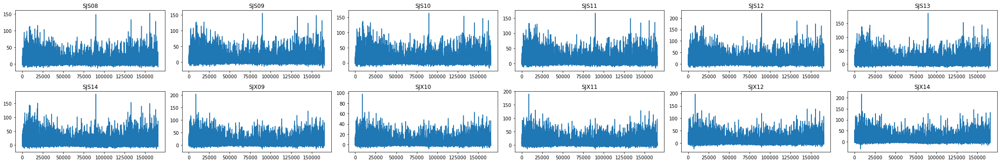

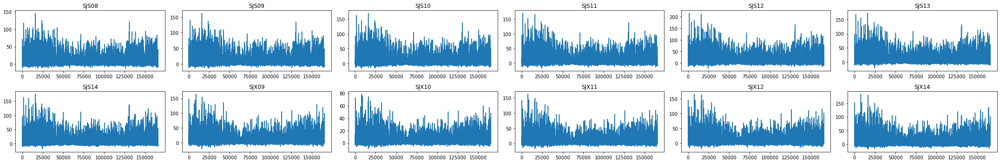

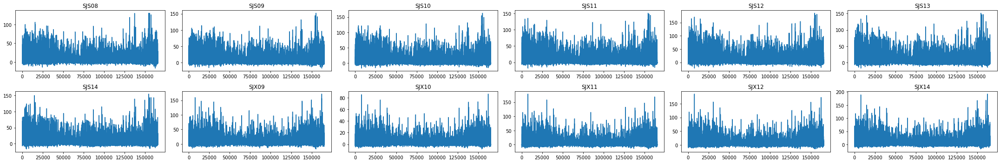

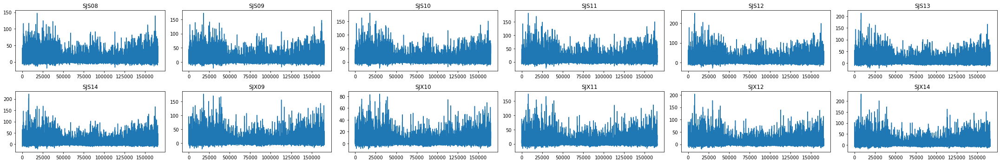

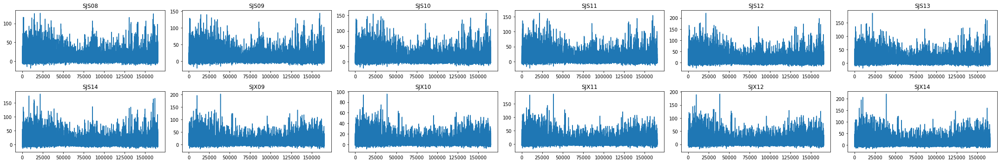

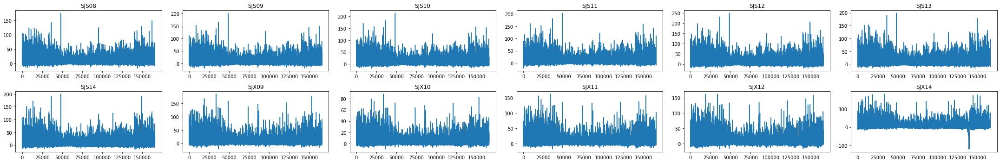

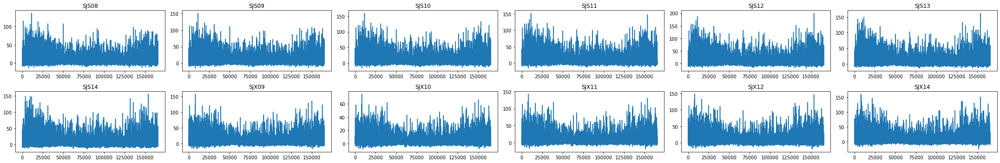

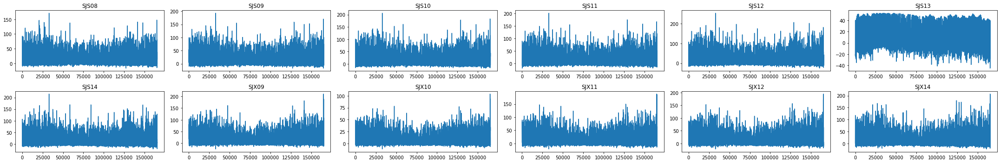

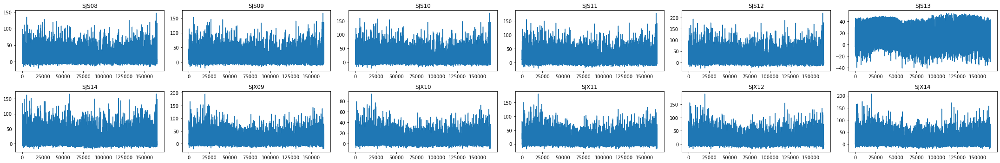

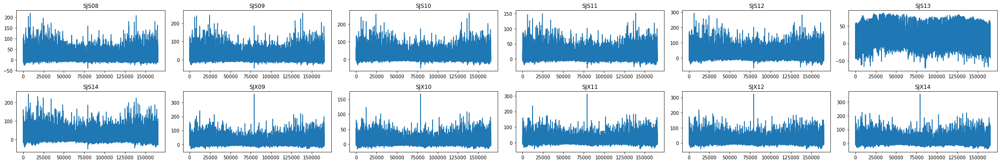

In [176]:
for i in range(10):
    fig, ax = plt.subplots(2,6,figsize=(30,5))
    num = 0
    
    for j in range(2):
        for k in range(6):
            idx = num
            num += 1
            
            ax[j][k].set_title(cable_title[idx])
            ax[j][k].plot(cable_diff_rolling[i][idx])
    plt.tight_layout()
    plt.show()

In [ ]:
["SJS09", "SJS10", "SJS11", "SJS12", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]

In [213]:
cable_data.shape

(10, 12, 172620)

In [214]:
divide_cable = cable_data[:, 1:]
divide_cable.shape

(10, 11, 172620)

In [215]:
divide_cable_1 = divide_cable[:, :4]
divide_cable_2 = divide_cable[:, 5:]

In [216]:
divide_cable_1.shape, divide_cable_2.shape

((10, 4, 172620), (10, 6, 172620))

In [219]:
divides = []
for i in range(10):
    d = np.concatenate([divide_cable_1[i], divide_cable_2[i]])
    divides.append(d)
divides = np.array(divides)
divides.shape

(10, 10, 172620)

In [225]:
cable_title_org = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]

In [220]:
cable_title = ["SJS09", "SJS10", "SJS11", "SJS12", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]

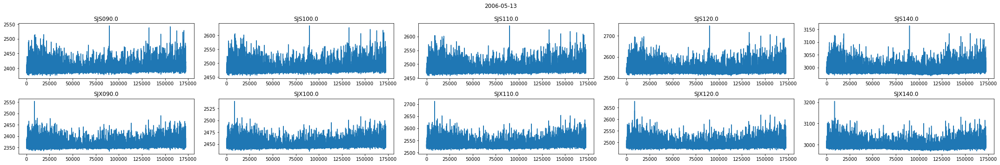

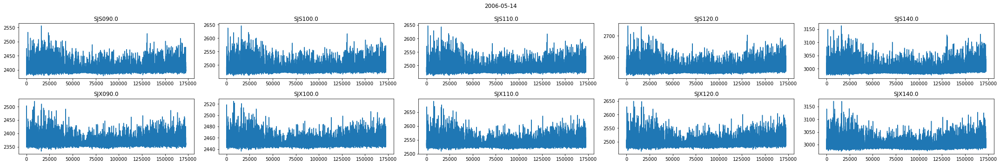

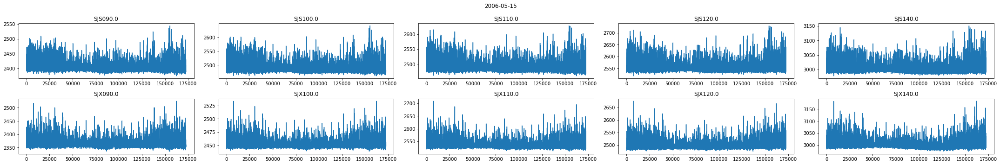

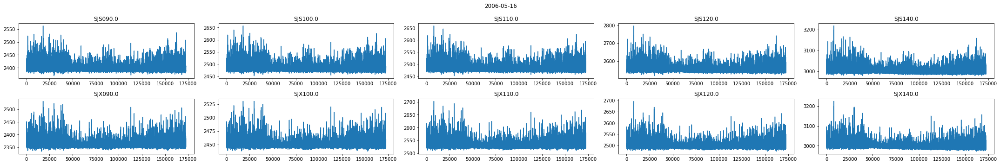

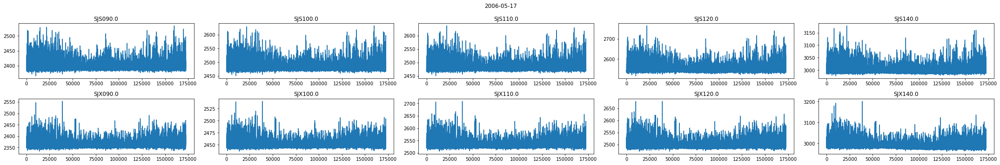

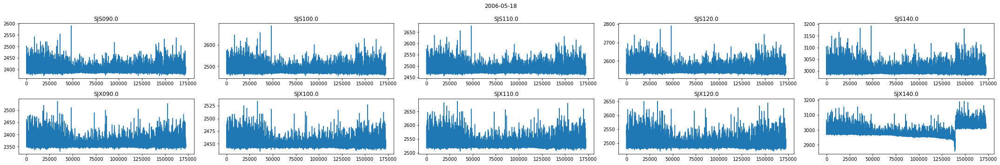

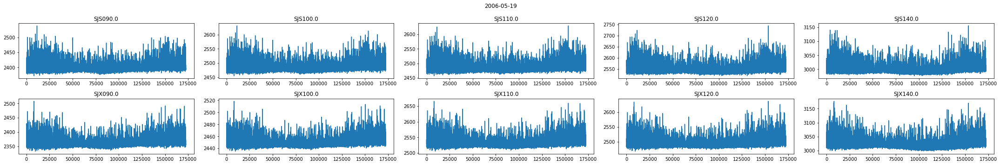

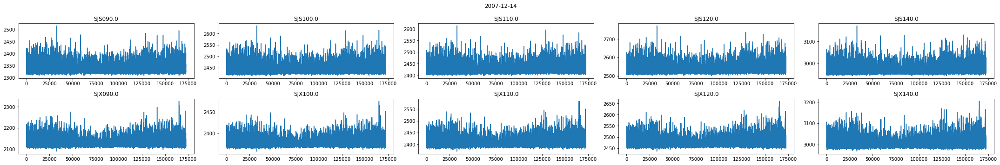

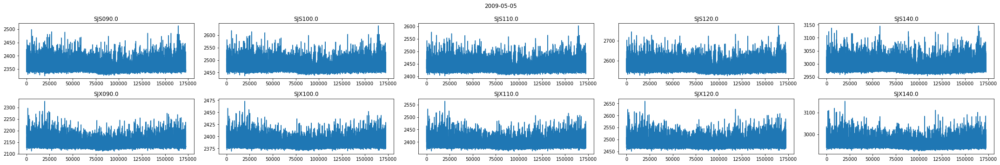

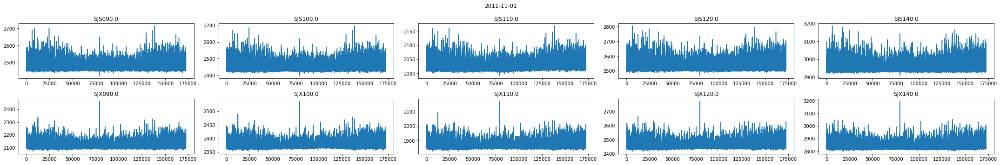

In [227]:
divide_list = []
for i in range(10):
    divide_list.append([])
    fig, ax = plt.subplots(2,5,figsize=(30,5))
    num = 0
    
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            if idx >= 0 and idx <= 3: c_idx = idx + 1
            else: c_idx = idx+2
            
            #print(cable_title_org[c_idx], cable_title[idx])
            
            ax[j][k].set_title(cable_title[idx] + str(np.sum(cable_data[i][c_idx] - divides[i][idx])))
            ax[j][k].plot(divides[i][idx])
    plt.suptitle(file_names[i])
    plt.tight_layout()
    plt.show()

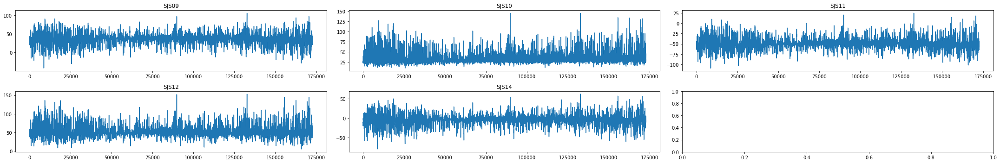

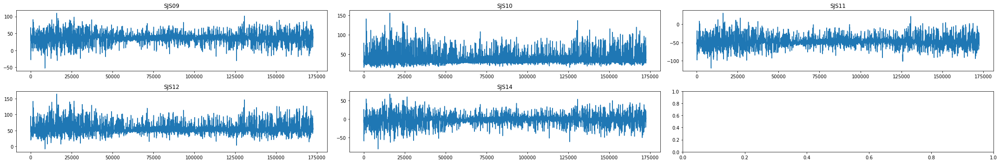

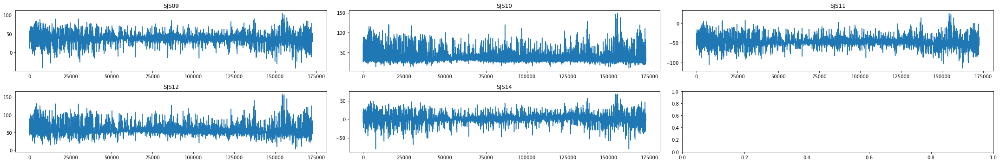

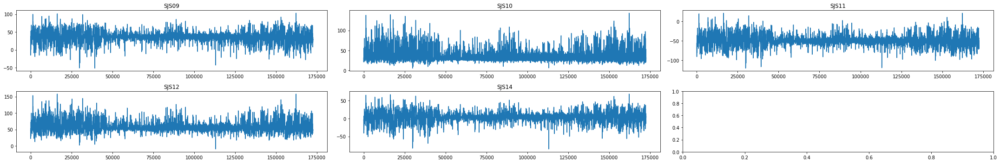

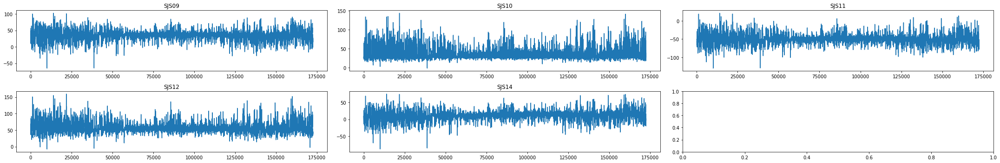

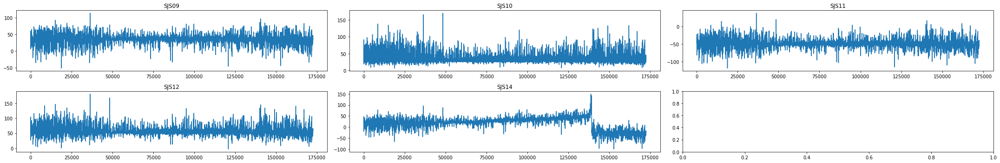

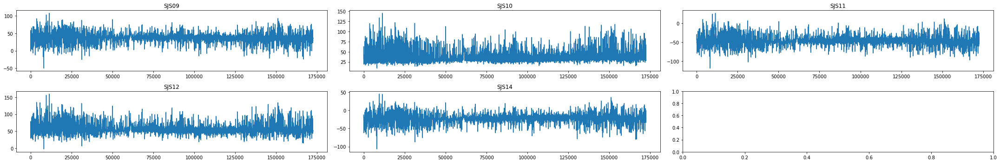

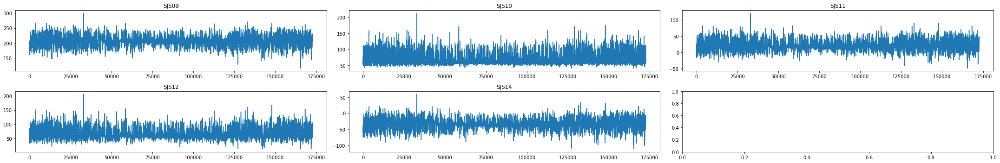

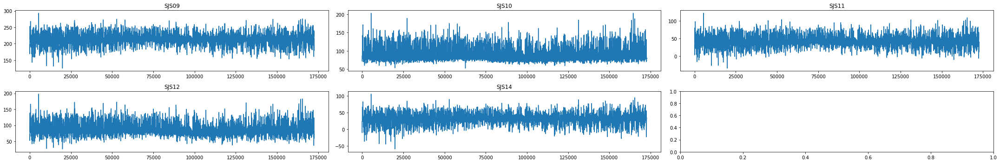

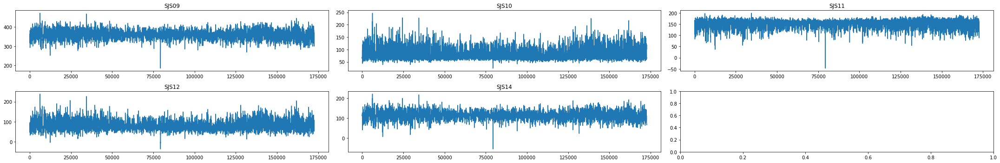

In [245]:
divide_list = []
for i in range(10):
    divide_list.append([])
    fig, ax = plt.subplots(2,3,figsize=(30,5))
    num = 0
    
    for j in range(2):
        for k in range(3):
            if num >= 5:
                break
            idx = num
            num += 1
            #print(idx)
            #divide = divides[i][idx] / divides[i][idx+5]
            divide = divides[i][idx] - divides[i][idx+5]
            divide_list[i].append(divide)
            
            ax[j][k].set_title(cable_title[idx])
            ax[j][k].plot(divide)
    plt.tight_layout()
    plt.show()

In [246]:
divide_list = np.array(divide_list)
divide_list.shape

(10, 5, 172620)

In [ ]:
for i in range(len())

In [189]:
np.where(cable_diff_rolling[-1][0] == 0)

(array([  7299,  14735,  28824,  50419,  79235,  93623, 100930, 151201],
       dtype=int64),)

In [184]:
min(np.abs(cable_diff_rolling[-1][0]))

0.0

In [187]:
np.count_nonzero(cable_diff_rolling[-1][0] == 0)

8

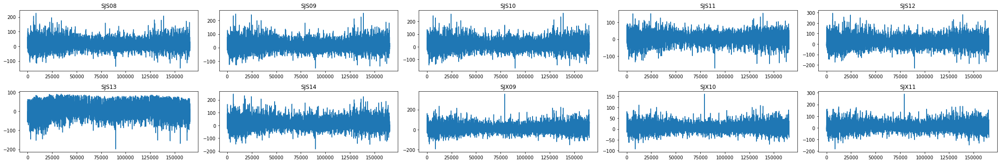

In [141]:
fig, ax = plt.subplots(2, 5, figsize=(30,5))
num = 0
for i in range(2):
    for j in range(5):
        idx = num
        num += 1
        
        ax[i][j].set_title(cable_title[idx])
        ax[i][j].plot(cable_diff_rolling[-1][idx] - cable_diff_rolling[0][idx])
plt.tight_layout()

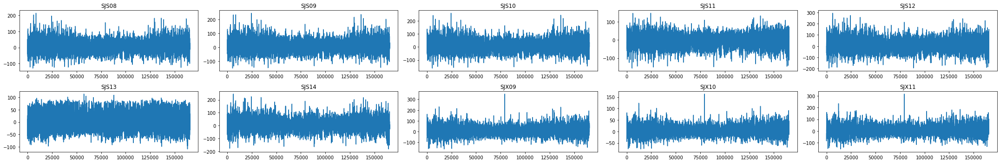

In [142]:
fig, ax = plt.subplots(2, 5, figsize=(30,5))
num = 0
for i in range(2):
    for j in range(5):
        idx = num
        num += 1
        
        ax[i][j].set_title(cable_title[idx])
        ax[i][j].plot(cable_diff_rolling[-1][idx] - cable_diff_rolling[-2][idx])
plt.tight_layout()

In [146]:
diff = cable_diff_rolling[-1] - cable_diff_rolling[-2]

In [147]:
diff.shape

(12, 165600)

In [149]:
diff = diff[:, ::180]

In [155]:
km = TimeSeriesKMeans(n_clusters=2, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(diff)
y_pred

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


266459.335 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


187562.218 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


187562.218 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


267538.442 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


154198.356 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


154198.356 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished


array([0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1], dtype=int64)

In [154]:
km = TimeSeriesKMeans(n_clusters=4, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(diff)
y_pred

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


140296.603 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


94728.385 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


94728.385 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


137722.292 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


90890.542 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


90890.542 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    0.3s finished


array([2, 2, 2, 2, 1, 1, 1, 0, 2, 3, 3, 3], dtype=int64)

In [233]:
divide_train = divide_list.reshape(-1, divide_list.shape[2])
divide_train.shape

(50, 172620)

In [234]:
km = TimeSeriesKMeans(n_clusters = 2, verbose=True, random_state=0)
y_pred = km.fit_predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

101.317 --> 61.898 --> 60.193 --> 60.193 --> 


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 1, 0, 0]], dtype=int64)

In [235]:
km = TimeSeriesKMeans(n_clusters = 3, verbose=True, random_state=0)
y_pred = km.fit_predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

47.758 --> 45.069 --> 45.069 --> 


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [1, 0, 2, 0, 0]], dtype=int64)

In [236]:
km = TimeSeriesKMeans(n_clusters = 4, verbose=True, random_state=0)
y_pred = km.fit_predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

23.757 --> 16.014 --> 15.645 --> 14.956 --> 14.868 --> 14.868 --> 


array([[0, 0, 3, 0, 3],
       [0, 0, 3, 0, 3],
       [0, 0, 3, 0, 3],
       [0, 0, 3, 0, 3],
       [0, 0, 3, 0, 0],
       [0, 0, 3, 0, 0],
       [0, 0, 3, 0, 3],
       [2, 0, 0, 0, 3],
       [2, 0, 0, 0, 0],
       [1, 0, 2, 0, 0]], dtype=int64)

In [240]:
divide_train = divide_list[:, :, ::180]
divide_train = divide_train.reshape(-1, divide_train.shape[2])
divide_train.shape

(50, 959)

In [241]:
km = TimeSeriesKMeans(n_clusters=2, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = km.fit_predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.310 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.071 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.057 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.389 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.072 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.057 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.057 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 1, 0, 0]], dtype=int64)

In [242]:
divide_train = divide_list[-1]
divide_train.shape

(5, 172620)

In [243]:
km = TimeSeriesKMeans(n_clusters = 2, verbose=True, random_state=0)
y_pred = km.fit_predict(divide_train)
#y_pred = y_pred.reshape(10, 5)
y_pred

75.906 --> 70.028 --> 70.028 --> 


array([1, 0, 0, 0, 0], dtype=int64)

In [244]:
km = TimeSeriesKMeans(n_clusters = 3, verbose=True, random_state=0)
y_pred = km.fit_predict(divide_train)
#y_pred = y_pred.reshape(10, 5)
y_pred

8.515 --> 3.106 --> 3.106 --> 


array([1, 0, 2, 0, 0], dtype=int64)

### Diff

In [247]:
diff_train = divide_list.reshape(-1, divide_list.shape[2])
diff_train.shape

(50, 172620)

In [248]:
km = TimeSeriesKMeans(n_clusters = 2, verbose=True, random_state=0)
y_pred = km.fit_predict(diff_train)
y_pred = y_pred.reshape(10, 5)
y_pred

523396158.865 --> 375361998.495 --> 364785586.777 --> 364785586.777 --> 


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 1, 0, 0]], dtype=int64)

In [249]:
km = TimeSeriesKMeans(n_clusters = 3, verbose=True, random_state=0)
y_pred = km.fit_predict(diff_train)
y_pred = y_pred.reshape(10, 5)
y_pred

314257960.481 --> 278935063.600 --> 278935063.600 --> 


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [1, 0, 2, 0, 2]], dtype=int64)

In [250]:
km = TimeSeriesKMeans(n_clusters = 4, verbose=True, random_state=0)
y_pred = km.fit_predict(diff_train)
y_pred = y_pred.reshape(10, 5)
y_pred

133901338.122 --> 102740445.978 --> 101514147.163 --> 100662319.449 --> 99657110.647 --> 99079890.815 --> 99079890.815 --> 


array([[0, 0, 3, 0, 3],
       [0, 0, 3, 0, 3],
       [0, 0, 3, 0, 3],
       [0, 0, 3, 0, 3],
       [0, 0, 3, 0, 0],
       [0, 0, 3, 0, 0],
       [0, 0, 3, 0, 3],
       [2, 0, 0, 0, 3],
       [2, 0, 0, 0, 0],
       [1, 0, 2, 0, 2]], dtype=int64)

### Diff Rolling Diff